In [1]:
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt 
from  matplotlib import animation, rc
from matplotlib import patches as patches
import pandas as pd
import math
from tqdm import tqdm

In [2]:
# load data file
csv = pd.read_csv('Q1_countrydata.csv')
csv.rename(columns= {'Last_Update':'Date'}, inplace= True)
csv.rename(columns= {'Long_':'Long'}, inplace= True)

csv

,Province_State,Country_Region,Date,Lat,Long,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,1/3/2021 5:22,33.939110,67.709953,51526,2191,41727
1,NaN,Albania,1/3/2021 5:22,41.153300,20.168300,58991,1190,34353
2,NaN,Algeria,1/3/2021 5:22,28.033900,1.659600,100159,2769,67611
3,NaN,Andorra,1/3/2021 5:22,42.506300,1.521800,8166,84,7463
4,NaN,Angola,1/3/2021 5:22,-11.202700,17.873900,17608,407,11189
...,...,...,...,...,...,...,...,...
3975,NaN,Zambia,1/3/2021 5:22,-13.133897,27.849332,21230,392,18942
3976,NaN,Zimbabwe,1/3/2021 5:22,-19.015438,29.154857,14491,377,11363
3977,Alaska,United States,4/2/2021 15:13,60.388600,-162.890520,157,0,0
3978,Alaska,United States,4/2/2021 15:13,61.166660,-149.900000,222,3,0


In [3]:
invalid = []
i = 0
pd.options.mode.chained_assignment = None  # default='warn'
j=83
n0 = len(csv['Country_Region'])-1

while i < n0-j:
  # case where diff province but same country on same day
  if csv['Country_Region'][i]==csv['Country_Region'][i+j] and csv['Date'][i]==csv['Date'][i+j]:
    csv['Confirmed'][i] += csv['Confirmed'][i+j]
    csv['Deaths'][i] += csv['Deaths'][i+j]
    csv['Recovered'][i] += csv['Recovered'][i+j]
    invalid.append(i+j)
  i+=1

csv.drop(invalid, axis=0, inplace=True)
print("Invalid entries dropped.")

C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1331239068.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  csv['Confirmed'][i] += csv['Confirmed'][i+j]
C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1331239068.py:11: FutureWarning:

Invalid entries dropped.


C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1331239068.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  csv['Deaths'][i] += csv['Deaths'][i+j]
C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1331239068.py:12: FutureWarning: Chain

In [4]:
# feature extraction from csv
dates = []
lats = []
longs = []
conf = []
rec = []
deaths = []
regions_all = []
regions = []

# removing discrepancies in data
for z in range(n0):
  # add data, making sure it is not deleted
  if z not in invalid and csv['Confirmed'][z] != -1 and csv['Recovered'][z] != -1 and csv['Deaths'][z] != -1:
    regions_all.append(csv['Country_Region'][z])
    dates.append(csv['Date'][z])
    lats.append(csv['Lat'][z].astype('float'))
    longs.append(csv['Long'][z].astype('float'))
    conf.append(csv['Confirmed'][z].astype('float'))
    rec.append(csv['Recovered'][z].astype('float'))
    deaths.append(csv['Deaths'][z].astype('float'))

# neural networks always tend to work better if the data is normalized:
mconf = max(conf)
mrec = max(rec)
mdeaths = max(deaths)
regions = list(dict.fromkeys(regions_all))

features_total = np.array([[conf[i]/mconf, rec[i]/mrec, deaths[i]/mdeaths, regions_all[i]] 
                     for i in range(len(regions_all))])

In [5]:
for i in range(len(features_total)):
  for j in range(len(features_total[i])-1):
    if math.isnan(float(features_total[i][j])):
      features_total[i][j] = 0.0

In [6]:
# select features corresponding to a certain date

def getEntriesPerDate(date):
  print("Date selected:", date)
  idxs = []
  for i in range(len(dates)):
    if dates[i] != date:
      idxs.append(i)
  return np.delete(np.delete(features_total, 3, 1), idxs, 0).astype('float')

sel_date = dates[-8]
features_sel_date = getEntriesPerDate(sel_date)
features_sel_date = np.nan_to_num(features_sel_date)

Date selected: 1/3/2021 5:22


In [7]:
features_sel_date_ratio = features_sel_date.copy()
features_sel_date_ratio[:,2] = features_sel_date[:,2] /features_sel_date[:,0]  #recovered as a ratio of confirmed
features_sel_date_ratio[:,1] = features_sel_date[:,1] /features_sel_date[:,0]  #death as a ratio of confirmed

for i in range(len(features_sel_date_ratio[:,2])):
    if not features_sel_date_ratio[i,0]:
        features_sel_date_ratio[i,1] = 0
        features_sel_date_ratio[i,2] = 0
# for i in range(len(features_sel_date[:,1])):
#     print(f'{features_sel_date[i,0]}     {features_sel_date_ratio[i,0]}', end = '  ')
#     print(f'{features_sel_date[i,1]}     {features_sel_date_ratio[i,1]}', end = '  ')
#     print(f'{features_sel_date[i,2]}     {features_sel_date_ratio[i,2]}')

C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1654283579.py:2: RuntimeWarning: invalid value encountered in divide
  features_sel_date_ratio[:,2] = features_sel_date[:,2] /features_sel_date[:,0]  #recovered as a ratio of confirmed
C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1654283579.py:3: RuntimeWarning: divide by zero encountered in divide
  features_sel_date_ratio[:,1] = features_sel_date[:,1] /features_sel_date[:,0]  #death as a ratio of confirmed
C:\Users\Syedm\AppData\Local\Temp\ipykernel_82756\1654283579.py:3: RuntimeWarning: invalid value encountered in divide
  features_sel_date_ratio[:,1] = features_sel_date[:,1] /features_sel_date[:,0]  #death as a ratio of confirmed


In [8]:
# bring lat and long to scale to figure out right size of SOM
lats = lats + abs(min(lats))
longs = longs + abs(min(lats))
scale_fact = 10
net_dimx = max(lats)//scale_fact
net_dimy = max(longs)//scale_fact
net_dimx, net_dimy

(12.0, 17.0)

In [9]:
csv.loc[csv['Country_Region']=='Australia']

,Province_State,Country_Region,Date,Lat,Long,Confirmed,Deaths,Recovered
8,Australian Capital Territory,Australia,1/3/2021 5:22,-35.4735,149.0124,118,3,114
9,New South Wales,Australia,1/3/2021 5:22,-33.8688,151.2093,4958,54,0
10,Northern Territory,Australia,1/3/2021 5:22,-12.4634,130.8456,81,0,71
11,Queensland,Australia,1/3/2021 5:22,-27.4698,153.0251,1255,6,1232
12,South Australia,Australia,1/3/2021 5:22,-34.9285,138.6007,580,4,566
13,Tasmania,Australia,1/3/2021 5:22,-42.8821,147.3272,234,13,221
14,Victoria,Australia,1/3/2021 5:22,-37.8136,144.9631,20391,820,19539
15,Western Australia,Australia,1/3/2021 5:22,-31.9505,115.8605,867,9,838


In [10]:
# Reducing 
csv
csv.loc[csv['Country_Region']=='Australia']
# csv.set_index('Country_Region', inplace=True)
# csv.loc[(csv.index=='Austrailia')]

,Province_State,Country_Region,Date,Lat,Long,Confirmed,Deaths,Recovered
8,Australian Capital Territory,Australia,1/3/2021 5:22,-35.4735,149.0124,118,3,114
9,New South Wales,Australia,1/3/2021 5:22,-33.8688,151.2093,4958,54,0
10,Northern Territory,Australia,1/3/2021 5:22,-12.4634,130.8456,81,0,71
11,Queensland,Australia,1/3/2021 5:22,-27.4698,153.0251,1255,6,1232
12,South Australia,Australia,1/3/2021 5:22,-34.9285,138.6007,580,4,566
13,Tasmania,Australia,1/3/2021 5:22,-42.8821,147.3272,234,13,221
14,Victoria,Australia,1/3/2021 5:22,-37.8136,144.9631,20391,820,19539
15,Western Australia,Australia,1/3/2021 5:22,-31.9505,115.8605,867,9,838


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


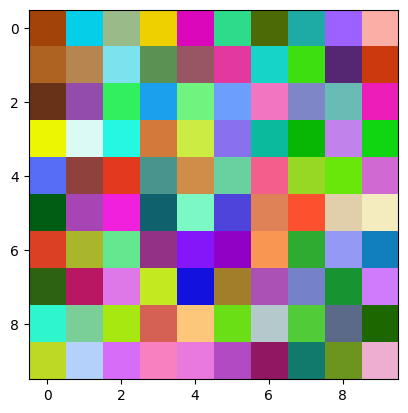

<Figure size 640x480 with 0 Axes>

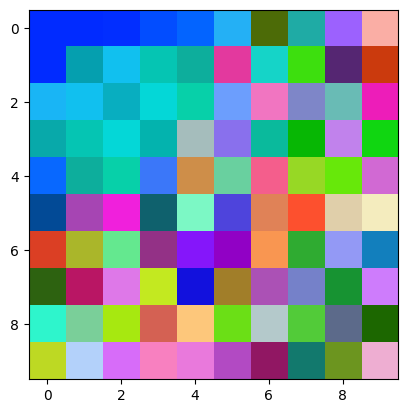

In [11]:
from typing import Union
from typing import List
import matplotlib.colors as colors

cblues = ['thistle', 'violet', 'mediumorchid',
          'darkviolet', 'royalblue', 'blue',
          'navy', 'lime', 'limegreen',
          'darkgreen']
cmap = colors.ListedColormap(cblues)
# setting custom boundaries because simple normalization would not work effectively in map
boundaries = np.array([0, 0.00005, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.03, 0.1, 0.5, 1])
# multiplying values by 100000 so that they are easier whole numbers to understand on colorbar
norm = colors.BoundaryNorm(boundaries*100000, cmap.N, clip=True)
class SOM():
    def __init__(self, size :List[int],
                 learning_rate :float, 
                 init_radius: float, 
                 dimension:int, 
                 iterations:int,
                 Training_data,
                 seed: int = 0  ):
        self.rng = np.random.default_rng(seed)
        size.append(dimension) 
        self.size = np.array(size)
        self.Network = self.rng.random(size)
        self.learning_rate = learning_rate
        self.init_raduis = init_radius
        self.init_learning_rate = learning_rate
        self.radius = init_radius
        self.iterations = iterations
        self.Training_data = Training_data
        self.time_constant = iterations / np.log(init_radius)
        return
    def BMU(self, X):
        '''
        Input:
        X: Input vector
        Returns:
        (BMU, idx): The neuron and index
        '''
        dist = self.manhattan_distance(self.Network, X)
        # print(dist.shape)
        assert dist.shape == self.Network.shape[:-1]
        BMU_idx = np.argwhere(dist == dist.min())[0]

        return self.Network[BMU_idx[0],BMU_idx[1],:]
    
    def update_neurons(self,X, curr_neuron, winining_neuron):
        neighborhood = self.neighborhood(curr_neuron,winining_neuron)
        return curr_neuron + self.learning_rate * neighborhood*(X- curr_neuron)
    
    def neighborhood(self,curr_neuron, wining_neuron):
        return np.exp(-0.5*(self.manhattan_distance(curr_neuron,wining_neuron))**2/self.radius**2) 
    
    def manhattan_distance(self,v1:np.ndarray,v2:np.ndarray):
        abs_diff = v1-v2
        abs_diff = abs_diff**2
        return np.sum(abs_diff, axis = -1)**0.5
    
    def lr_scheduler(self, i :int):
        self.learning_rate =  self.init_learning_rate * np.exp(-i/self.iterations)


    def decay_radius(self, i :int):
        self.radius = self.init_raduis * np.exp(-i/self.iterations)


    def train(self):
        n = self.Training_data.shape[0]
        # print(n)
        sampler = np.random.randint(0, n, size=self.iterations)
        fig = plt.figure()
        for it in range(self.iterations):
            X = self.Training_data[sampler[it],:]
       
            bmu = self.BMU(X)

            # decay the SOM parameters
            self.decay_radius(it)
            self.lr_scheduler(it)

            for J in range(self.size[0]*self.size[1]):
                k = J//self.size[0]
                l = J%self.size[1]
                curr_neuron = self.Network[k,l,:]
      
                if k**2 + l**2 <= self.radius**2:            
                    self.Network[k,l,:] = self.update_neurons(X,curr_neuron, bmu)
                    assert self.Network[k,l,:].shape == curr_neuron.shape

        return self.Network


# Meta data
N = 10
size_SOM = N*N
Init_learning_rate = 0.2
initial_radius = N/2       

# size = [int(net_dimx), int(net_dimy)]
size = [10,10]
TrainingData = features_sel_date_ratio
som =SOM(size, learning_rate=Init_learning_rate, 
    init_radius=initial_radius,
    dimension=features_sel_date.shape[1],
    Training_data=TrainingData, iterations=10000)
plt.figure()
# output = np.sum(som.Network, axis = 2)
plt.imshow(som.Network)#,animated=True, cmap=cmap, norm=norm)
som.train()
plt.figure()
# output = np.sum(som.Network, axis = 2)
plt.imshow(som.Network)#,animated=True, cmap=cmap, norm=norm)


# print(f'The shape of the SOM lattice = {som.Network.shape}')
# plt.imshow(som.Network)

        
    

Visualizing with a Map


In [12]:
features_sel_date

array([[0.01952183, 0.01962301, 0.03366626],
       [0.02235012, 0.01615523, 0.01828519],
       [0.03794758, 0.03179551, 0.04254763],
       ...,
       [0.00079601, 0.0006565 , 0.00937308],
       [0.00804348, 0.00890788, 0.00602336],
       [0.00549025, 0.00534369, 0.00579287]])

In [13]:
!pip install --upgrade geopandas

In [14]:
rng = np.random.default_rng(0)
Network = np.random.randint(0,5,[2,3,4])
x = np.random.randint(0,5,[1,4])